In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
from __future__ import print_function
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import torch
from torch import nn
from tqdm.auto import tqdm#show loop progress
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torchvision.models as models


import argparse
import os

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import torchvision.models as models
import matplotlib.animation as animation
from IPython.display import HTML

from scipy import linalg
from torch.nn.functional import adaptive_avg_pool2d

from PIL import Image

import matplotlib.pyplot as plt
import sys
import numpy as np
import os
# print(os.listdir("../input"))

import time
from torchvision.models.inception import inception_v3
import numpy as np
from scipy.stats import entropy
from torch.autograd import Variable
from torch.nn import functional as F
import torch.utils.data
import torch
from torch import nn

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/fashion-mnist-for-dis-score/__results__.html
/kaggle/input/fashion-mnist-for-dis-score/__notebook__.ipynb
/kaggle/input/fashion-mnist-for-dis-score/__output__.json
/kaggle/input/fashion-mnist-for-dis-score/dis_score_loader
/kaggle/input/fashion-mnist-for-dis-score/custom.css
/kaggle/input/fashion-mnist-for-dis-score/data/FashionMNIST/processed/training.pt
/kaggle/input/fashion-mnist-for-dis-score/data/FashionMNIST/processed/test.pt
/kaggle/input/fashion-mnist-for-dis-score/data/FashionMNIST/raw/t10k-labels-idx1-ubyte
/kaggle/input/fashion-mnist-for-dis-score/data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz
/kaggle/input/fashion-mnist-for-dis-score/data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz
/kaggle/input/fashion-mnist-for-dis-score/data/FashionMNIST/raw/train-labels-idx1-ubyte.gz
/kaggle/input/fashion-mnist-for-dis-score/data/FashionMNIST/raw/t10k-images-idx3-ubyte
/kaggle/input/fashion-mnist-for-dis-score/data/FashionMNIST/raw/train-labels-idx1-ubyte
/kaggle/input/fas

In [2]:
# class FashionCNN(nn.Module):
    
#     def __init__(self):
#         super(FashionCNN, self).__init__()
        
#         self.layer1 = nn.Sequential(
#             nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3, padding=1),
#             nn.BatchNorm2d(32),
#             nn.ReLU(),
#             nn.MaxPool2d(kernel_size=2, stride=2)
#         )
        
#         self.layer2 = nn.Sequential(
#             nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
#             nn.BatchNorm2d(64),
#             nn.ReLU(),
#             nn.MaxPool2d(2)
#         )
        
#         self.fc1 = nn.Linear(in_features=64*6*6, out_features=600)
#         self.drop = nn.Dropout2d(0.25)
#         self.fc2 = nn.Linear(in_features=600, out_features=120)
#         self.fc3 = nn.Linear(in_features=120, out_features=10)
        
#     def forward(self, x):
#         out = self.layer1(x)
#         out = self.layer2(out)
#         out = out.view(out.size(0), -1)
#         out = self.fc1(out)
#         out = self.drop(out)
#         out = self.fc2(out)
#         out = self.fc3(out)
        
#         return out
# model = FashionCNN()
# model.load_state_dict(torch.load('../input/cnn-c1-fashion-mnist/model_state'))
# model.to('cuda')
# model.eval()

In [3]:
# def find_data(trainloader,epoch):
#     correct_count, all_count = 0, 0
#     predicted_labels = []
#     data = []
#     for images in trainloader:
#         images = images.to('cuda')
#         test = Variable(images)
#         outputs = cnn_c1(test)
#         predicted = torch.max(outputs, 1)[1]
#         for i in range(len(images)):
#             data.append([images[i],pred_label[i]])
#     len(data)
#     gan_testloader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
#     torch.save(gan_testloader, './gan_data_epoch_{}'.format(epoch))

In [4]:
train_loader = torch.load('../input/fashion-mnist-for-dis-score/dis_score_loader')
#test_loader = torch.load('../input/mnist-splitter/svdash_dataloader')
len(train_loader)

625

In [5]:
import argparse
import os
import numpy as np
import math

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

# os.makedirs("images", exist_ok=True)

# parser = argparse.ArgumentParser()
# parser.add_argument("--n_epochs", type=int, default=200, help="number of epochs of training")
# parser.add_argument("--batch_size", type=int, default=64, help="size of the batches")
# parser.add_argument("--lr", type=float, default=0.0002, help="adam: learning rate")
# parser.add_argument("--b1", type=float, default=0.5, help="adam: decay of first order momentum of gradient")
# parser.add_argument("--b2", type=float, default=0.999, help="adam: decay of first order momentum of gradient")
# parser.add_argument("--n_cpu", type=int, default=8, help="number of cpu threads to use during batch generation")
# parser.add_argument("--latent_dim", type=int, default=100, help="dimensionality of the latent space")
# parser.add_argument("--n_classes", type=int, default=10, help="number of classes for dataset")
# parser.add_argument("--img_size", type=int, default=32, help="size of each image dimension")
# parser.add_argument("--channels", type=int, default=1, help="number of image channels")
# parser.add_argument("--sample_interval", type=int, default=400, help="interval between image sampling")
# opt = parser.parse_args()
# print(opt)
n_epochs = 201
batch_size= 64
lr=0.0002
b1=0.5
b2=0.999
n_cpu=2
latent_dim=100
n_classes=10
img_size=28
channels=1
sample_interval=400
device = 'cuda'





img_shape = (channels, img_size, img_size)

cuda = True if torch.cuda.is_available() else False


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.label_emb = nn.Embedding(n_classes, n_classes)

        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(latent_dim + n_classes, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(img_shape))),
            nn.Tanh()
        )

    def forward(self, noise, labels):
        # Concatenate label embedding and image to produce input
        gen_input = torch.cat((self.label_emb(labels), noise), -1)
        img = self.model(gen_input)
        img = img.view(img.size(0), *img_shape)
        return img


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.label_embedding = nn.Embedding(n_classes, n_classes)

        self.model = nn.Sequential(
            nn.Linear(n_classes + int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
        )

    def forward(self, img, labels):
        # Concatenate label embedding and image to produce input
        d_in = torch.cat((img.view(img.size(0), -1), self.label_embedding(labels)), -1)
        validity = self.model(d_in)
        return validity


# Loss functions
adversarial_loss = torch.nn.MSELoss()

# Initialize generator and discriminator
generator = Generator()
discriminator = Discriminator()

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()

# Configure data loader
#os.makedirs("../../data/mnist", exist_ok=True)
dataloader =train_loader

# torch.utils.data.DataLoader(
#     datasets.MNIST(
#         "../../data/mnist",
#         train=True,
#         download=True,
#         transform=transforms.Compose(
#             [transforms.Resize(img_size), transforms.ToTensor(), transforms.Normalize([0.5], [0.5])]
#         ),
#     ),
#     batch_size=batch_size,
#     shuffle=True,
# )

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if cuda else torch.LongTensor


def sample_image(n_row, batches_done):
    """Saves a grid of generated digits ranging from 0 to n_classes"""
    # Sample noise
    z = Variable(FloatTensor(np.random.normal(0, 1, (n_row ** 2, latent_dim))))
    # Get labels ranging from 0 to n_classes for n rows
    labels = np.array([num for _ in range(n_row) for num in range(n_row)])
    labels = Variable(LongTensor(labels))
    gen_imgs = generator(z, labels)
    save_image(gen_imgs.data, "./%d.png" % batches_done, nrow=n_row, normalize=True)


# ----------
#  Training
# ----------
generated_images = []
psnr_score = []
mmd_score = []
fid_score = []
is_score= []
checkpoint = [1,10,20,30,40,50,100,150,200]
for epoch in range(n_epochs):
    fake_image_array = []
    real_array = []
    for i, (imgs, labels) in enumerate(dataloader):

        batch_size = imgs.shape[0]

        # Adversarial ground truths
        valid = Variable(FloatTensor(batch_size, 1).fill_(1.0), requires_grad=False)
        fake = Variable(FloatTensor(batch_size, 1).fill_(0.0), requires_grad=False)

        # Configure input
        real_imgs = Variable(imgs.type(FloatTensor))
        labels = Variable(labels.type(LongTensor))

        # -----------------
        #  Train Generator
        # -----------------

        optimizer_G.zero_grad()

        # Sample noise and labels as generator input
        z = Variable(FloatTensor(np.random.normal(0, 1, (batch_size, latent_dim))))
        gen_labels = Variable(LongTensor(np.random.randint(0, n_classes, batch_size)))

        # Generate a batch of images
        gen_imgs = generator(z, gen_labels)
        if epoch in checkpoint:
            for i in range(len(gen_imgs)):
                generated_images.append([gen_imgs[i],gen_labels[i].cpu().numpy()])
            fake_image_array.append(gen_imgs)
            real_array.append(real_imgs)


        # Loss measures generator's ability to fool the discriminator
        validity = discriminator(gen_imgs, gen_labels)
        g_loss = adversarial_loss(validity, valid)

        g_loss.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Loss for real images
        validity_real = discriminator(real_imgs, labels)
        d_real_loss = adversarial_loss(validity_real, valid)

        # Loss for fake images
        validity_fake = discriminator(gen_imgs.detach(), gen_labels)
        d_fake_loss = adversarial_loss(validity_fake, fake)

        # Total discriminator loss
        d_loss = (d_real_loss + d_fake_loss) / 2

        d_loss.backward()
        optimizer_D.step()
        
        #---------
        #calculation
        #---------
            
        print(
            "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch, n_epochs, i, len(dataloader), d_loss.item(), g_loss.item())
        )
        
        batches_done = epoch * len(dataloader) + i
        if batches_done % sample_interval == 0:
            sample_image(n_row=10, batches_done=batches_done)
    if epoch in checkpoint:
        print("========E=======P========O========C=========H=======:",epoch)
#        temp_image = []
#         for curr in generated_images:
#             for i in curr:
#                 temp_image.append(i)
        trainloader = torch.utils.data.DataLoader(generated_images,batch_size=64, shuffle=True)
        torch.save(trainloader, './gan_data_epoch_{}'.format(epoch))
#       find_data(trainloader,epoch)
        generated_images = []

[Epoch 0/201] [Batch 0/625] [D loss: 0.454127] [G loss: 0.910475]
[Epoch 0/201] [Batch 1/625] [D loss: 0.371412] [G loss: 0.877111]
[Epoch 0/201] [Batch 2/625] [D loss: 0.285197] [G loss: 0.853690]
[Epoch 0/201] [Batch 3/625] [D loss: 0.192482] [G loss: 0.821269]
[Epoch 0/201] [Batch 4/625] [D loss: 0.132772] [G loss: 0.793721]
[Epoch 0/201] [Batch 5/625] [D loss: 0.092045] [G loss: 0.761934]
[Epoch 0/201] [Batch 6/625] [D loss: 0.076957] [G loss: 0.714503]
[Epoch 0/201] [Batch 7/625] [D loss: 0.106080] [G loss: 0.689027]
[Epoch 0/201] [Batch 8/625] [D loss: 0.067841] [G loss: 0.688455]
[Epoch 0/201] [Batch 9/625] [D loss: 0.072496] [G loss: 0.690895]
[Epoch 0/201] [Batch 10/625] [D loss: 0.079779] [G loss: 0.691073]
[Epoch 0/201] [Batch 11/625] [D loss: 0.070784] [G loss: 0.675297]
[Epoch 0/201] [Batch 12/625] [D loss: 0.082704] [G loss: 0.649135]
[Epoch 0/201] [Batch 13/625] [D loss: 0.077506] [G loss: 0.627792]
[Epoch 0/201] [Batch 14/625] [D loss: 0.078279] [G loss: 0.606044]
[Epoc

/opt/conda/lib/python3.7/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


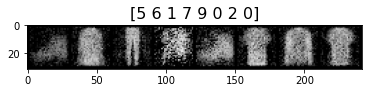

In [6]:
test = torch.load('./gan_data_epoch_1')
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
for batch_idx, (temp, target) in enumerate(test):
    img_grid = make_grid(temp[0:8,], nrow=8)
    img_target_labels = target[0:8,].numpy()
    break
    
plt.imshow(img_grid.detach().cpu().numpy().transpose((1,2,0)))
plt.rcParams['figure.figsize'] = (10, 2)
plt.title(img_target_labels, size=16)
plt.show()